# Occurances and Characteristics of Park-Based Encampments Reported to Los Angeles 311 - Spatial Autocorrelation Notebook
See other notebooks for initial data review; or annual concatination + base analysis

## Import necessary libraries, tools, and data

In [1]:
#import libraries/tools
#read data
import pandas as pd

#create spatial data
import geopandas as gpd
from geopandas import GeoDataFrame

#basemaps
import contextily as ctx

#spatial statistics
import esda
from esda.moran import Moran, Moran_Local
import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation
import libpysal as lps

#graphics
import matplotlib.pyplot as plt
import plotly.express as px
import folium

#data viz
import seaborn as sns

#point patterns
from pointpats import centrography
from matplotlib.patches import Ellipse
import numpy

#make interactive
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [2]:
#import data
parks=gpd.read_file('data/LA_Parks_Information.geojson')
encamp_20=gpd.read_file('data/2020-311_Homeless_Encampment_Requests_raw.csv')
encamp_19=gpd.read_file('data/2019-311_Homeless_Encampments_Requests_raw.csv')
encamp_18=gpd.read_file('data/2018-311_Homeless_Encampments_Requests_raw.csv')
encamp_17=gpd.read_file('data/2017-311_Homeless_Encampment_Requests_raw.csv')
encamp_16=gpd.read_file('data/2016-311_Homeless_Encampment_Requests_raw.csv')
encamp_15=gpd.read_file('data/2015-311_Homeless_Encampment_Requests_raw.csv')
resources=gpd.read_file('data/Countywide_Parks_and_Open_Space__Public_-_Hosted_.csv')
city=gpd.read_file('data/la-city-council-districts-2012.geojson')

## Set a function to clean annual data before concatination

In [3]:
#consolidate and clean data by year

def clean_data(df):
    #drop columns
    columns_to_drop = ['SRNumber',
                   'UpdatedDate',
                   'ActionTaken',
                   'Owner',
                   'RequestType',
                   'Status',
                   'RequestSource',
                   'MobileOS',
                   'Anonymous',
                   'AssignTo',
                   'ServiceDate',
                   'ClosedDate',
                   'Address',
                   'HouseNumber',
                   'Direction',
                   'StreetName',
                   'Suffix',
                   'ZipCode',
                   'Location',
                   'TBMPage',
                   'TBMColumn',
                   'TBMRow']
    df = df.drop(columns_to_drop,axis=1)
    #rename columns
    df.columns = ['created',
                     'loc_verified',
                     'approx_loc',
                     'lat',
                     'long',
                     'apc',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precinct',
                     'geometry']
    #drop non-existant council districts  
    df=df[df.cd.apply(lambda x: x.isnumeric())]
    df['cd'] = df['cd'].astype(int)
    df=df[df['cd']>=0]
    df=df[df['cd']<=16]
    #add geometry to plot
    g_df = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.long, df.lat))
    df=df.set_crs("EPSG:4326")
    df.crs
    df.plot()
    df = pd.DataFrame(df)
    return df

### Run Function

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,1/1/2020 0:38,Y,,34.04355075,-118.2175745,East Los Angeles APC,14,Jose Huizar,50,BOYLE HEIGHTS NC,HOLLENBECK,POINT (-118.21757 34.04355),2020
1,1/1/2020 1:07,Y,N,34.17028666,-118.4487458,South Valley APC,4,David Ryu,20,VAN NUYS NC,VAN NUYS,POINT (-118.44875 34.17029),2020
2,1/1/2020 1:12,Y,N,34.17248092,-118.466094,South Valley APC,4,David Ryu,20,VAN NUYS NC,VAN NUYS,POINT (-118.46609 34.17248),2020
3,1/1/2020 1:14,Y,N,34.0492227,-118.3418346,Central APC,10,Herb J. Wesson Jr.,104,OLYMPIC PARK NC,WILSHIRE,POINT (-118.34183 34.04922),2020
4,1/1/2020 6:22,Y,,34.06383989,-118.2882115,Central APC,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,POINT (-118.28821 34.06384),2020


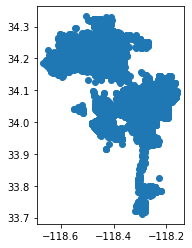

In [4]:
#2020
encamp_20=clean_data(encamp_20)
#add a year column
encamp_20['year']='2020'
encamp_20.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,8/26/2019 13:56,Y,N,33.70633171,-118.2929289,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.29293 33.70633),2019
1,2/23/2019 12:47,Y,N,33.70971583,-118.2864142,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28641 33.70972),2019
2,6/30/2019 21:42,Y,,33.71047284,-118.2862046,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28620 33.71047),2019
3,6/30/2019 17:34,Y,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.29300 33.71148),2019
4,7/2/2019 15:15,Y,,33.71372994,-118.293106,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.29311 33.71373),2019


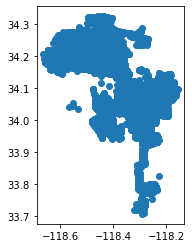

In [5]:
#2019
encamp_19=clean_data(encamp_19)
encamp_19['year']='2019'
encamp_19.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,8/21/2018 7:47,Y,,33.7067159,-118.2876246,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28762 33.70672),2018
1,8/10/2018 21:08,Y,Y,33.7098142,-118.2854935,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28549 33.70981),2018
2,7/30/2018 10:31,Y,,33.7098142,-118.2854935,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28549 33.70981),2018
3,6/3/2018 16:26,Y,,33.7098142,-118.2854935,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28549 33.70981),2018
4,5/4/2018 9:02,Y,,33.7098142,-118.2854935,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,POINT (-118.28549 33.70981),2018


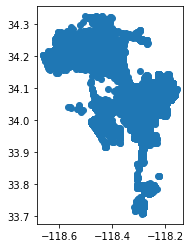

In [6]:
#2018
encamp_18=clean_data(encamp_18)
encamp_18['year']='2018'
encamp_18.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,1/1/2017 10:30,Y,,34.09658918,-118.3381616,Central APC,13,Mitch O'Farrell,32,CENTRAL HOLLYWOOD NC,HOLLYWOOD,POINT (-118.33816 34.09659),2017
1,1/1/2017 10:37,Y,N,34.03674605,-118.3755976,South Los Angeles APC,10,Herb J. Wesson Jr.,60,P.I.C.O. NC,WILSHIRE,POINT (-118.37560 34.03675),2017
2,1/1/2017 11:00,Y,,34.05742408,-118.307502,Central APC,10,Herb J. Wesson Jr.,55,WILSHIRE CENTER - KOREATOWN NC,OLYMPIC,POINT (-118.30750 34.05742),2017
3,1/1/2017 12:00,Y,,34.00109792,-118.4686821,West Los Angeles APC,11,Mike Bonin,68,VENICE NC,PACIFIC,POINT (-118.46868 34.00110),2017
4,1/1/2017 12:24,Y,N,34.25010497,-118.4509682,North Valley APC,6,Nury Martinez,101,MISSION HILLS NC,MISSION,POINT (-118.45097 34.25010),2017


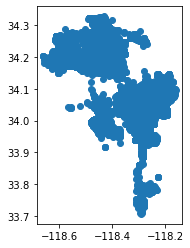

In [7]:
#2017
encamp_17=clean_data(encamp_17)
encamp_17['year']='2017'
encamp_17.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,1/1/2016 11:59,Y,N,34.2645238,-118.4716582,North Valley APC,7,Felipe Fuentes,101,MISSION HILLS NC,MISSION,POINT (-118.47166 34.26452),2016
1,1/2/2016 10:01,Y,N,34.10121756,-118.2918109,Central APC,13,Mitch O'Farrell,36,LOS FELIZ NC,NORTHEAST,POINT (-118.29181 34.10122),2016
2,1/2/2016 13:29,Y,N,33.95278674,-118.279836,South Los Angeles APC,8,Marqueece Harris-Dawson,87,EMPOWERMENT CONGRESS SOUTHEAST AREA NDC,SOUTHEAST,POINT (-118.27984 33.95279),2016
3,1/3/2016 8:56,Y,N,34.06657254,-118.270664,Central APC,13,Mitch O'Farrell,97,WESTLAKE NORTH NC,RAMPART,POINT (-118.27066 34.06657),2016
4,1/3/2016 11:03,Y,N,34.04829961,-118.2928245,Central APC,1,Gilbert Cedillo,76,PICO UNION NC,OLYMPIC,POINT (-118.29282 34.04830),2016


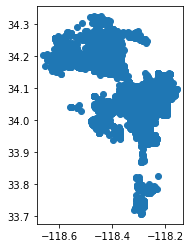

In [8]:
#2016
encamp_16=clean_data(encamp_16)
encamp_16['year']='2016'
encamp_16.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,8/5/2015 7:33,Y,N,34.07713781,-118.278987,East Los Angeles APC,13,Mitch O'Farrell,38,SILVER LAKE NC,RAMPART,POINT (-118.27899 34.07714),2015
1,8/5/2015 8:52,Y,N,34.0992746,-118.3100639,Central APC,13,Mitch O'Farrell,33,HOLLYWOOD STUDIO DISTRICT NC,HOLLYWOOD,POINT (-118.31006 34.09927),2015
2,8/5/2015 9:11,Y,N,34.08926863,-118.287133,Central APC,13,Mitch O'Farrell,34,EAST HOLLYWOOD NC,RAMPART,POINT (-118.28713 34.08927),2015
3,8/5/2015 9:39,Y,N,34.06078297,-118.2802744,Central APC,1,Gilbert Cedillo,54,MACARTHUR PARK NC,RAMPART,POINT (-118.28027 34.06078),2015
4,8/5/2015 9:55,Y,N,34.21865452,-118.5711235,South Valley APC,3,Bob Blumenfield,14,WINNETKA NC,TOPANGA,POINT (-118.57112 34.21865),2015


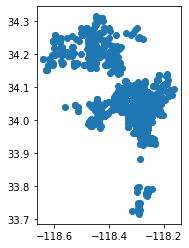

In [9]:
#2015
encamp_15=clean_data(encamp_15)
encamp_15['year']='2015'
encamp_15.head()

### Concatinate Data

In [10]:
all_encamp=pd.concat([encamp_15,encamp_16,encamp_17,encamp_18,encamp_19,encamp_20], ignore_index=True)
all_encamp=all_encamp
all_encamp.describe

<bound method NDFrame.describe of                 created loc_verified approx_loc          lat          long  \
0         8/5/2015 7:33            Y          N  34.07713781   -118.278987   
1         8/5/2015 8:52            Y          N   34.0992746  -118.3100639   
2         8/5/2015 9:11            Y          N  34.08926863   -118.287133   
3         8/5/2015 9:39            Y          N  34.06078297  -118.2802744   
4         8/5/2015 9:55            Y          N  34.21865452  -118.5711235   
...                 ...          ...        ...          ...           ...   
163633  9/16/2020 12:14            Y             34.04746043   -118.265961   
163634  9/16/2020 12:18            Y             34.04803728  -118.2667563   
163635  9/16/2020 12:24            Y             34.00435596  -118.4300466   
163636  9/16/2020 12:26            Y          N  34.25033694  -118.6015934   
163637  9/16/2020 12:36            Y          N  33.99636794   -118.281236   

                          apc

## Add Geography to Encampment Data

In [11]:
all_encamp.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry,year
0,8/5/2015 7:33,Y,N,34.07713781,-118.278987,East Los Angeles APC,13,Mitch O'Farrell,38,SILVER LAKE NC,RAMPART,POINT (-118.27899 34.07714),2015
1,8/5/2015 8:52,Y,N,34.0992746,-118.3100639,Central APC,13,Mitch O'Farrell,33,HOLLYWOOD STUDIO DISTRICT NC,HOLLYWOOD,POINT (-118.31006 34.09927),2015
2,8/5/2015 9:11,Y,N,34.08926863,-118.287133,Central APC,13,Mitch O'Farrell,34,EAST HOLLYWOOD NC,RAMPART,POINT (-118.28713 34.08927),2015
3,8/5/2015 9:39,Y,N,34.06078297,-118.2802744,Central APC,1,Gilbert Cedillo,54,MACARTHUR PARK NC,RAMPART,POINT (-118.28027 34.06078),2015
4,8/5/2015 9:55,Y,N,34.21865452,-118.5711235,South Valley APC,3,Bob Blumenfield,14,WINNETKA NC,TOPANGA,POINT (-118.57112 34.21865),2015


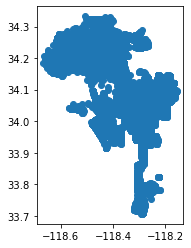

In [12]:
#first add geometry to encampments
all_encamp = gpd.GeoDataFrame(all_encamp, geometry='geometry',crs = 4326)
all_encamp.plot() 

In [13]:
#reproject appropriately
all_encamp = all_encamp.to_crs('EPSG:3857')

In [14]:
#add geometry files for point analysis
all_encamp['x'] = all_encamp.geometry.x
all_encamp['y'] = all_encamp.geometry.y
data_mini = all_encamp

## Clean Parks Data

In [15]:
#let's try to cut this down to workable size 

#drop parks not actually in LA
parks=parks.sort_values(by='cd_real',ascending = False)
parks['cd_real'] = parks['cd_real'].astype(int)
parks_la=parks[parks['cd_real']<=16]
parks_la=parks_la.sort_values(by='cd_real',ascending = True)

#drop unnecessary columns
columns_to_drop = ['objectid',
                   'park_id',
                   'name_alpha',
                   'region',
                   'name_publi',
                   'park_class']
parks_la = parks_la.drop(columns_to_drop,axis=1)

#reset index
parks_la.reset_index(inplace=True)
parks_la = parks_la.rename(columns = {'index':'park_id'})

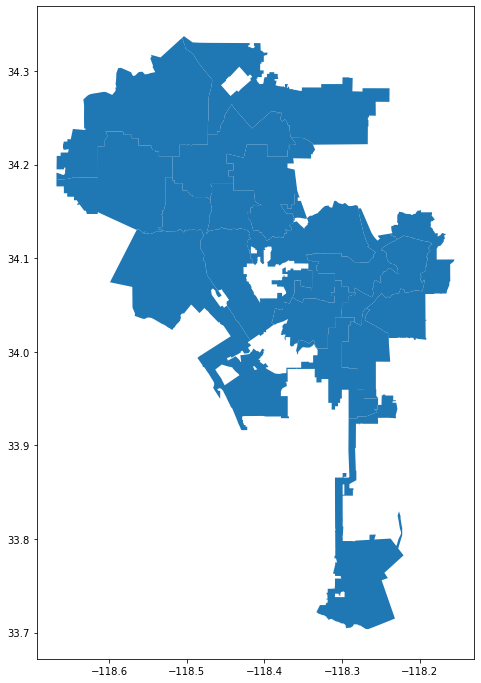

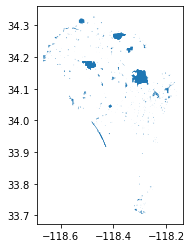

In [16]:
#clean/add parks resources

#drop unnecessary columns
columns_to_drop = ['OBJECTID',
                   'RPT_ACRES',
                   'UNIT_ID',
                   'LMS_ID',
                   'PARK_LBL',
                   'GIS_ACRES',
                   'AGNCY_NAME',
                   'ZIP','HOURS',
                   'DGPRK',
                   'GYM',
                   'PHONES',
                   'IS_COUNTY',
                   'PLGND',
                   'POOLS',
                   'Shape__Area',
                   'Shape__Length',
                   'FITZN',
                   'MPFLD',
                   'ADDRESS',
                   'CITY',
                   'SK8PK',
                   'TENIS',
                   'BSKTB',
                   'BASEB',
                   'MPFLD',
                   'SOCCR',
                   'TOTAL_GOOD',
                   'AGNCY_TYP',
                   'AGNCY_LEV',
                   'AGNCY_WEB',
                   'TKIT_SUM',
                   'PRKINF_CND',
                   'AM_TRLS',
                   'TRLS_MI',
                   'SPPAD',
                   'MNG_AGENCY',
                   'NDS_AN_TYP',
                   'NEEDS_ANLZ',
                   'SNRCT',
                   'AMEN_RPT',
                   'COMCT',
                   'AM_OPNSP',
                   'TOTAL_FAIR',
                   'TYPE',
                   'TOTAL_POOR']
resources = resources.drop(columns_to_drop,axis=1)

#rename in lower case
resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'center_lat',
                     'center_long',
                     'geometry']

#make geodata frame
g_resources = gpd.GeoDataFrame(
    resources, geometry=gpd.points_from_xy(resources.center_long, resources.center_lat))
resources=resources.set_crs("EPSG:4326")
resources.crs

#use city shapefile to exclude county park resources
city.plot(
            figsize=(20,12),
) 
city=city.set_crs("EPSG:4326")
city.crs
la_resources = gpd.sjoin(resources, city)

#drop/rename columns
columns_to_drop = ['center_lat',
                   'center_long',
                   'index_right',
                   'kind',
                   'external_id',
                   'name_right',
                   'slug',
                   'set',
                   'metadata',
                   'resource_uri']
la_resources = la_resources.drop(columns_to_drop,axis=1)
la_resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'geometry']

#join resources to park shapes
park_info = gpd.sjoin(parks_la, la_resources)
#drop/rename columns
columns_to_drop = ['park_id',
                   'index_right',
                    'shape_leng']
park_info = park_info.drop(columns_to_drop,axis=1)
park_info.columns = ['name',
                     'park_area',
                     'park_acres',
                     'issubpark',
                     'address',
                     'cd',
                     'geometry',
                     'parks_in_cd',
                     'access',
                     'type',
                     'picnic',
                     'restroom'
                       ]
#drop sub-parks
park_info=park_info[park_info['issubpark']=="N"]
#and plot
park_info.plot()

## Spatial Join Parks and Encampments
As 50% of encampments use approximate or unverified locations, a buffer captures park-adjacent reports.

In [17]:
#add a .5 block buffer to park shape
park_info = park_info.to_crs('EPSG:4326')
park_info['geometry']=park_info.geometry.buffer(.001)

<ipython-input-17-e33b2f671d03>:3: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  park_info['geometry']=park_info.geometry.buffer(.001)


In [18]:
#and spatial join
park_info = park_info.to_crs('EPSG:3857')
park_encamp = gpd.sjoin(park_info, all_encamp)
park_encamp.describe

<bound method NDFrame.describe of                             name      park_area     park_acres issubpark  \
0     Vista Hermosa Soccer Field  81856.4316403  1.87917261403         N   
0     Vista Hermosa Soccer Field  81856.4316403  1.87917261403         N   
0     Vista Hermosa Soccer Field  81856.4316403  1.87917261403         N   
0     Vista Hermosa Soccer Field  81856.4316403  1.87917261403         N   
0     Vista Hermosa Soccer Field  81856.4316403  1.87917261403         N   
..                           ...            ...            ...       ...   
554                    Peck Park  3246101.37868  74.5205317523         N   
556  Los Angeles Maritime Museum  107971.798241  2.47870133447         N   
556  Los Angeles Maritime Museum  107971.798241  2.47870133447         N   
556  Los Angeles Maritime Museum  107971.798241  2.47870133447         N   
556  Los Angeles Maritime Museum  107971.798241  2.47870133447         N   

                                               addres

In [19]:
#clean joined data
columns_to_drop = ['cd_left',
                    'picnic',
                    'restroom',
                   'index_right',
                   'apc',
                   'picnic',
                   'restroom',
                   'x',
                   'y'
                        ]
park_encamp = park_encamp.drop(columns_to_drop,axis=1)
park_encamp.columns = ['park_name',
                     'park_area',
                     'park_acres',
                     'issubpark',
                     'address',
                     'geometry',
                     'parks_in_cd',
                     'access',
                     'type',
                     'created',
                     'loc_verified',
                     'approx_loc',
                     'lat',
                     'long',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precint',
                     'year'
                       ]
park_encamp.head()

,park_name,park_area,park_acres,issubpark,address,geometry,parks_in_cd,access,type,created,loc_verified,approx_loc,lat,long,cd,cd_member,nc,nc_name,precint,year
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,3/1/2018 14:44,Y,N,34.06070482,-118.2577309,1,Gilbert Cedillo,52,DOWNTOWN LOS ANGELES,RAMPART,2018
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,1/13/2018 16:38,Y,N,34.06072851,-118.2582595,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2018
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,4/10/2017 8:18,Y,N,34.06072851,-118.2582595,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,7/20/2017 9:23,Y,N,34.06091226,-118.2586652,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,7/18/2017 11:02,Y,N,34.06091226,-118.2586652,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017


In [20]:
#add a column to measure the total number of reports between 2015-20 for each park
park_encamp['total'] = park_encamp['park_name'].map(park_encamp['park_name'].value_counts())
park_encamp.head()

,park_name,park_area,park_acres,issubpark,address,geometry,parks_in_cd,access,type,created,...,approx_loc,lat,long,cd,cd_member,nc,nc_name,precint,year,total
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,3/1/2018 14:44,...,N,34.06070482,-118.2577309,1,Gilbert Cedillo,52,DOWNTOWN LOS ANGELES,RAMPART,2018,7
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,1/13/2018 16:38,...,N,34.06072851,-118.2582595,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2018,7
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,4/10/2017 8:18,...,N,34.06072851,-118.2582595,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017,7
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,7/20/2017 9:23,...,N,34.06091226,-118.2586652,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017,7
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026","POLYGON ((-13164443.763 4036915.495, -13164451...",Vista Hermosa Soccer Field,Open Access,Special Use,7/18/2017 11:02,...,N,34.06091226,-118.2586652,1,Gilbert Cedillo,97,WESTLAKE NORTH NC,RAMPART,2017,7


In [21]:
#now that we have the total, dissolve duplicates
park_encamp_diss = park_encamp.dissolve(by='park_name')
park_encamp_diss.head

<bound method NDFrame.head of                                                                                    geometry  \
park_name                                                                                     
109th Street Recreation Center            POLYGON ((-13163444.642 4020062.754, -13163453...   
11th Avenue Park                          POLYGON ((-13172463.965 4026664.728, -13172463...   
1st And Broadway Civic Center Park (TBD)  POLYGON ((-13163027.936 4036182.702, -13163019...   
49th Street Pocket Park                   POLYGON ((-13165025.750 4028743.897, -13165014...   
61st Street Pocket Park                   POLYGON ((-13165912.254 4026697.705, -13165912...   
...                                                                                     ...   
Woodbridge Park                           POLYGON ((-13177745.283 4048806.766, -13177745...   
Woodland Hills Recreation Center          POLYGON ((-13204034.377 4052277.476, -13204092...   
Woodside Triangle   

In [22]:
#that is a heavy/slow dissolve, so make a copy we can revert back to
park_encamp_sig=park_encamp_diss

## Spatial Autocorrelation

,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,created,loc_verified,approx_loc,lat,long,cd,cd_member,nc,nc_name,precint,year,total
park_name,,,,,,,,,,,,,,,,,,,,
109th Street Recreation Center,"POLYGON ((-13163444.642 4020062.754, -13163453...",138253.38843,3.17387377054,N,"1464 E 109th St, LA 90059",109th Street Rec. Center,Open Access,Neighborhood Park,4/14/2020 15:09,Y,N,33.93568515,-118.2489274,15,Joe Buscaino,88,WATTS NC,SOUTHEAST,2020,2
11th Avenue Park,"POLYGON ((-13172463.965 4026664.728, -13172463...",9110.64496337,0.209152465704,N,"6116 S 11th Ave, LA 90043",11th Avenue Park,Open Access,Park Node,8/3/2017 15:04,Y,N,33.98363221,-118.3292687,8,Marqueece Harris-Dawson,80,PARK MESA HEIGHTS CC,77TH STREET,2017,3
1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.96357433772,N,"217 W 1st St, LA 90012",1st and Broadway Civic Center Park,Open Access,Pocket Park,7/8/2020 6:55,Y,N,34.05385821,-118.2434847,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,2020,79
49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189404743709,N,"670 E 49Th St, LA 90011",49th Street Pocket Park,Open Access,Park Node,2/19/2019 19:00,Y,,33.99846137,-118.2636003,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2019,3
61st Street Pocket Park,"POLYGON ((-13165912.254 4026697.705, -13165912...",5125.29755928,0.117661112501,N,"139-141 E 61st St, LA 90003",61st Street Pocket Park,Open Access,Park Node,10/29/2015 12:42,Y,N,33.98404212,-118.2720679,9,Curren D. Price Jr.,86,COMMUNITY AND NEIGHBORS FOR NINTH DISTRICT UNI...,NEWTON,2015,4


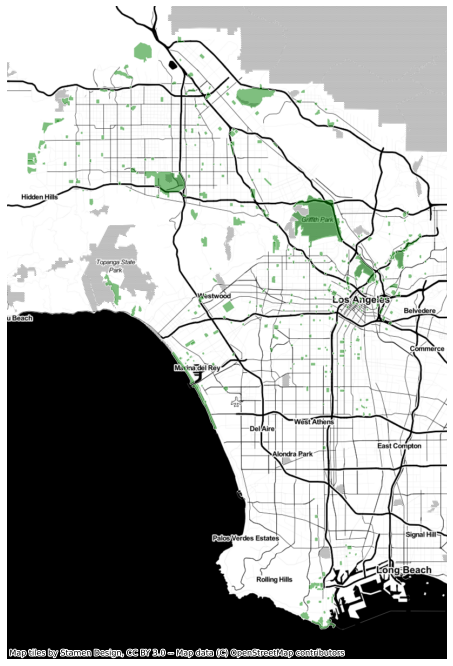

In [23]:
#confirm projection is mercator
park_encamp_sig = park_encamp_sig.to_crs(epsg=3857)

#check plot
ax=park_encamp_sig.plot(figsize=(12,12),
                      color='Green', 
                      edgecolor='white',
                      alpha=0.5)

# remove axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.Stamen.Toner)
park_encamp_sig.head()

In [24]:
#reset the index so that it is no longer "park_name"
park_encamp_sig.reset_index(inplace=True)
park_encamp_sig.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,created,...,approx_loc,lat,long,cd,cd_member,nc,nc_name,precint,year,total
0,109th Street Recreation Center,"POLYGON ((-13163444.642 4020062.754, -13163453...",138253.38843,3.17387377054,N,"1464 E 109th St, LA 90059",109th Street Rec. Center,Open Access,Neighborhood Park,4/14/2020 15:09,...,N,33.93568515,-118.2489274,15,Joe Buscaino,88,WATTS NC,SOUTHEAST,2020,2
1,11th Avenue Park,"POLYGON ((-13172463.965 4026664.728, -13172463...",9110.64496337,0.209152465704,N,"6116 S 11th Ave, LA 90043",11th Avenue Park,Open Access,Park Node,8/3/2017 15:04,...,N,33.98363221,-118.3292687,8,Marqueece Harris-Dawson,80,PARK MESA HEIGHTS CC,77TH STREET,2017,3
2,1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.96357433772,N,"217 W 1st St, LA 90012",1st and Broadway Civic Center Park,Open Access,Pocket Park,7/8/2020 6:55,...,N,34.05385821,-118.2434847,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,2020,79
3,49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189404743709,N,"670 E 49Th St, LA 90011",49th Street Pocket Park,Open Access,Park Node,2/19/2019 19:00,...,,33.99846137,-118.2636003,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2019,3
4,61st Street Pocket Park,"POLYGON ((-13165912.254 4026697.705, -13165912...",5125.29755928,0.117661112501,N,"139-141 E 61st St, LA 90003",61st Street Pocket Park,Open Access,Park Node,10/29/2015 12:42,...,N,33.98404212,-118.2720679,9,Curren D. Price Jr.,86,COMMUNITY AND NEIGHBORS FOR NINTH DISTRICT UNI...,NEWTON,2015,4


In [25]:
#clean up unecessary columns
columns_to_drop = ['created',
                   'loc_verified',
                   'approx_loc',
                    'lat',
                    'long',
                    'year']
park_encamp_sig = park_encamp_sig.drop(columns_to_drop,axis=1)
park_encamp_sig.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total
0,109th Street Recreation Center,"POLYGON ((-13163444.642 4020062.754, -13163453...",138253.38843,3.17387377054,N,"1464 E 109th St, LA 90059",109th Street Rec. Center,Open Access,Neighborhood Park,15,Joe Buscaino,88,WATTS NC,SOUTHEAST,2
1,11th Avenue Park,"POLYGON ((-13172463.965 4026664.728, -13172463...",9110.64496337,0.209152465704,N,"6116 S 11th Ave, LA 90043",11th Avenue Park,Open Access,Park Node,8,Marqueece Harris-Dawson,80,PARK MESA HEIGHTS CC,77TH STREET,3
2,1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.96357433772,N,"217 W 1st St, LA 90012",1st and Broadway Civic Center Park,Open Access,Pocket Park,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,79
3,49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189404743709,N,"670 E 49Th St, LA 90011",49th Street Pocket Park,Open Access,Park Node,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,3
4,61st Street Pocket Park,"POLYGON ((-13165912.254 4026697.705, -13165912...",5125.29755928,0.117661112501,N,"139-141 E 61st St, LA 90003",61st Street Pocket Park,Open Access,Park Node,9,Curren D. Price Jr.,86,COMMUNITY AND NEIGHBORS FOR NINTH DISTRICT UNI...,NEWTON,4


### Normalize by Finding Encampment Reports per Acre

In [26]:
#find encampment reports per acre
park_encamp_sig['park_acres'] = park_encamp_sig['park_acres'].astype(float)
park_encamp_sig['encamp_per_acre']=park_encamp_sig['total']/park_encamp_sig['park_acres']
park_encamp_sig.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre
0,109th Street Recreation Center,"POLYGON ((-13163444.642 4020062.754, -13163453...",138253.38843,3.173874,N,"1464 E 109th St, LA 90059",109th Street Rec. Center,Open Access,Neighborhood Park,15,Joe Buscaino,88,WATTS NC,SOUTHEAST,2,0.630145
1,11th Avenue Park,"POLYGON ((-13172463.965 4026664.728, -13172463...",9110.64496337,0.209152,N,"6116 S 11th Ave, LA 90043",11th Avenue Park,Open Access,Park Node,8,Marqueece Harris-Dawson,80,PARK MESA HEIGHTS CC,77TH STREET,3,14.343603
2,1st And Broadway Civic Center Park (TBD),"POLYGON ((-13163027.936 4036182.702, -13163019...",85532.956018,1.963574,N,"217 W 1st St, LA 90012",1st and Broadway Civic Center Park,Open Access,Pocket Park,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,79,40.232752
3,49th Street Pocket Park,"POLYGON ((-13165025.750 4028743.897, -13165014...",8250.43763411,0.189405,N,"670 E 49Th St, LA 90011",49th Street Pocket Park,Open Access,Park Node,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,3,15.839096
4,61st Street Pocket Park,"POLYGON ((-13165912.254 4026697.705, -13165912...",5125.29755928,0.117661,N,"139-141 E 61st St, LA 90003",61st Street Pocket Park,Open Access,Park Node,9,Curren D. Price Jr.,86,COMMUNITY AND NEIGHBORS FOR NINTH DISTRICT UNI...,NEWTON,4,33.995939


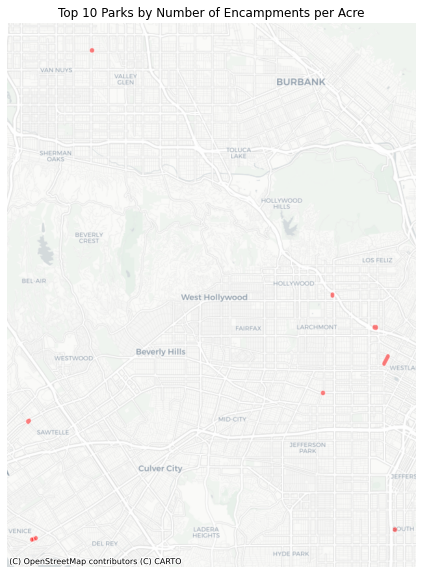

In [27]:
# map the top 10 parks
ax = park_encamp_sig.sort_values(by='encamp_per_acre',ascending=False)[:10].plot(figsize=(12,10),
                                                             color='red',
                                                             edgecolor='white',
                                                             alpha=0.5)


# title
ax.set_title('Top 10 Parks by Number of Encampments per Acre')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Remove Parks Under 3 Acres
These are not relevant for our study purposes

In [28]:
#sort by encampments per acre
park_encamp_sig=park_encamp_sig.sort_values(by='encamp_per_acre',ascending = False)
park_encamp_sig.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre
186,Marco Triangle,"POLYGON ((-13186900.755 4027523.540, -13186911...",1467.23312952,0.033683,N,Marco Place near intersection with Shell Ave,Marco Triangle,Open Access,Not Analyzed,11,Mike Bonin,68,VENICE NC,PACIFIC,65,1929.746962
62,Crescent Place Triangle,"POLYGON ((-13187022.443 4027494.806, -13187024...",706.857242364,0.016227,N,"1646 S Crescent Pl, Venice 90291",Crescent Place Triangle,Open Access,Not Analyzed,11,Mike Bonin,68,VENICE NC,PACIFIC,27,1663.865382
125,Hartland Mini-Park,"POLYGON ((-13183634.057 4055125.003, -13183623...",2873.7854301,0.065973,N,"6830 N Woodman Ave, Van Nuys 91405",Hartland Mini Park,Open Access,Not Analyzed,2,Paul Krekorian,20,VAN NUYS NC,VAN NUYS,63,954.931775
61,Country Club Heritage Park,"POLYGON ((-13170769.322 4035695.072, -13170780...",3647.84860118,0.083743,N,"1015 S Wilton Pl, LA 90018",Wilton Place Park,Open Access,Park Node,4,David Ryu,119,GREATER WILSHIRE NC,OLYMPIC,56,668.709288
166,Lexington Avenue Pocket Park,"POLYGON ((-13170208.078 4041468.137, -13170197...",7491.74063909,0.171987,N,"5523 W Lexington Ave, LA 90038",Lexington Avenue Pocket Park,Open Access,Park Node,13,Mitch O'Farrell,33,HOLLYWOOD STUDIO DISTRICT NC,HOLLYWOOD,110,639.581783


In [29]:
#drop pocket parks and park nodes
park_encamp_large = park_encamp_sig[park_encamp_sig['type']!="Pocket Park"]
park_encamp_large = park_encamp_sig[park_encamp_sig['type']!="Park Node"]
park_encamp_large.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre
186,Marco Triangle,"POLYGON ((-13186900.755 4027523.540, -13186911...",1467.23312952,0.033683,N,Marco Place near intersection with Shell Ave,Marco Triangle,Open Access,Not Analyzed,11,Mike Bonin,68,VENICE NC,PACIFIC,65,1929.746962
62,Crescent Place Triangle,"POLYGON ((-13187022.443 4027494.806, -13187024...",706.857242364,0.016227,N,"1646 S Crescent Pl, Venice 90291",Crescent Place Triangle,Open Access,Not Analyzed,11,Mike Bonin,68,VENICE NC,PACIFIC,27,1663.865382
125,Hartland Mini-Park,"POLYGON ((-13183634.057 4055125.003, -13183623...",2873.7854301,0.065973,N,"6830 N Woodman Ave, Van Nuys 91405",Hartland Mini Park,Open Access,Not Analyzed,2,Paul Krekorian,20,VAN NUYS NC,VAN NUYS,63,954.931775
38,Bundy Triangle,"POLYGON ((-13187146.126 4034130.385, -13187156...",9586.54483904,0.220078,N,"1500 S Bundy Dr, LA 90025",Bundy Triangle,Restricted Access,Not Analyzed,11,Mike Bonin,66,WEST LOS ANGELES NC,WEST LOS ANGELES,117,531.630499
215,Occidental Parkway,"POLYGON ((-13167400.080 4037597.907, -13167395...",24433.4628486,0.560917,N,"S Occidental Blvd, LA 90057",Occidental Parkway,Open Access,Not Analyzed,1,Gilbert Cedillo,53,RAMPART VILLAGE NC,RAMPART,255,454.612416


In [30]:
#since so many parks are not analyzed, simply remove all under 3 acres
park_encamp_large = park_encamp_large[park_encamp_large['park_acres']>=3]
park_encamp_large.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre
276,Shatto Recreation Center,"POLYGON ((-13167986.847 4038096.905, -13167977...",237571.355728,5.453910,N,"3191 W 4th St, LA 90020",Shatto Rec. Center,Open Access,Neighborhood Park,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,832,152.551114
266,San Pedro Plaza Park,"POLYGON ((-13166974.258 3992825.568, -13166980...",152749.805211,3.506667,N,"700 S Beacon St, San Pedro 90731",San Pedro Plaza Park,Open Access,Pocket Park,15,Joe Buscaino,95,CENTRAL SAN PEDRO NC,HARBOR,412,117.490482
231,Penmar Recreation Center,"POLYGON ((-13186748.007 4029310.478, -13186752...",522979.822165,12.006013,N,"1341 E Lake St, 90291",Penmar Rec. Center,Open Access,Community Park,11,Mike Bonin,68,VENICE NC,PACIFIC,1101,91.704051
234,Poinsettia Recreation Center,"POLYGON ((-13174825.755 4040739.966, -13174825...",274104.492308,6.292598,N,"7341 W Willoughby Ave, 90046",Poinsettia Rec. Center,Open Access,Neighborhood Park,5,Paul Koretz,58,MID CITY WEST CC,WILSHIRE,419,66.586165
130,Hollywood Recreation Center,"POLYGON ((-13172323.704 4041360.855, -13172312...",135760.05451,3.116634,N,"1122 N Cole Ave, LA 90038",Hollywood Rec. Center,Open Access,Pocket Park,13,Mitch O'Farrell,32,CENTRAL HOLLYWOOD NC,HOLLYWOOD,197,63.209209


In [31]:
# what are the top 10 parks by encampment reports/acre?
park_encamp_large = park_encamp_large.sort_values(by='encamp_per_acre',ascending=False)
chart=px.bar(park_encamp_large[:10],
       x='park_name',
       y='encamp_per_acre',
       color='type',
       title='Top 10 LA Parks by Encampment Reports per Acre',
       labels={'park_name':"Park Name",'encamp_per_acre':"Encampment Reports per Acre", 'type':"Park Type"}
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)
chart.update_traces(marker_line_width=0)

In [32]:
# what are the top 10 parks by encampment reports/acre not sorted by type?

#sorting for order
park_encamp_large['encamp_per_acre'] = park_encamp_large['encamp_per_acre'].astype(float)
park_encamp_large = park_encamp_large.sort_values(["encamp_per_acre"],ascending=(False))

#producing the table
fig7 = px.bar(park_encamp_large[:10], x="park_name", y="encamp_per_acre",
            hover_data=['cd','total'], barmode = 'stack', 
              color_continuous_scale=px.colors.sequential.Agsunset, 
)
fig7.update_traces(marker_line_width=0)
fig7.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1))
fig7.update_layout(
    title="LA Park Areas with the Most Encampment Reports per Acre",
    xaxis_title="Park Name",
    yaxis_title="Encampment Reports per Acre"
)
fig7.update_traces(marker_color='deeppink')
fig7.show()

In [33]:
#save the graph
fig7.write_html("Parks_Normalized_acerage.html")

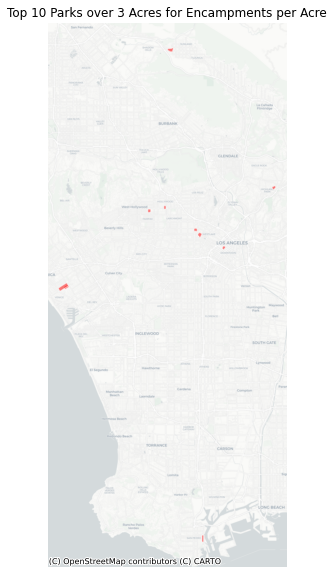

In [34]:
# map the top 10 large parks by number of encampment reports
ax = park_encamp_large.sort_values(by='encamp_per_acre',ascending=False)[:10].plot(figsize=(12,10),
                                                             color='red',
                                                             edgecolor='white',
                                                             alpha=0.5)


# title
ax.set_title('Top 10 Parks over 3 Acres for Encampments per Acre')

# no axis
ax.axis('off')

# add a basemap
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

### Calculate Spatial Weights - Spatial Lag

In [35]:
#calculate spatial weights. 
wq =  lps.weights.KNN.from_dataframe(park_encamp_large,k=8)
wq.transform = 'r'

In [36]:
# create a new column for the spatial lag
park_encamp_large['encamp_per_acre_lag'] = lps.weights.lag_spatial(wq, park_encamp_large['encamp_per_acre'])
park_encamp_large.sort_values(by='encamp_per_acre_lag',ascending=False).head(10)

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre,encamp_per_acre_lag
206,Normandie Recreation Center,"POLYGON ((-13169223.181 4034894.586, -13169222...",142508.174306,3.271551,N,"1550 S Normandie Ave, LA 90006",Normandie Playground,Open Access,Neighborhood Park,10,Herb J. Wesson Jr.,74,UNITED NEIGHBORHOODS OF THE HISTORIC ARLINGTON...,OLYMPIC,21,6.418975,41.683511
164,Lemon Grove Recreation Center,"POLYGON ((-13169766.213 4040619.036, -13169767...",168640.685869,3.871473,N,"4959 W Lemon Grove Ave, LA 90029",Lemon Grove Rec. Center,Open Access,Neighborhood Park,13,Mitch O'Farrell,34,EAST HOLLYWOOD NC,HOLLYWOOD,123,31.770854,40.570685
28,Barnsdall Park,"POLYGON ((-13168695.121 4042361.684, -13168696...",635668.513242,14.592999,N,"4800 W Hollywood Blvd, LA 90027",Barnsdall Park,Open Access,Community Park,4,David Ryu,36,LOS FELIZ NC,NORTHEAST,221,15.144248,38.171993
180,MacArthur Park,"POLYGON ((-13166893.513 4036883.220, -13166890...",1301083.66164,29.868890,N,"2230 W 6th St, 90057",MacArthur Park,Open Access,Community Regional Park,1,Gilbert Cedillo,54,MACARTHUR PARK NC,RAMPART,378,12.655308,37.318733
153,Lafayette Recreation Center,"POLYGON ((-13167434.608 4036991.354, -13167481...",423286.712199,9.717365,N,"625 S Lafayette Park Pl, LA 90057",Lafayette Park,Open Access,Neighborhood Park,1,Gilbert Cedillo,53,RAMPART VILLAGE NC,RAMPART,534,54.953171,35.844025
31,Bellevue Recreation Center,"POLYGON ((-13167202.544 4040300.678, -13167195...",396696.915467,9.106944,N,"826 N Lucille Ave, LA 90026",Bellevue Recreation Center,Open Access,Neighborhood Park,13,Mitch O'Farrell,38,SILVER LAKE NC,RAMPART,5,0.549032,34.747593
82,Echo Park,"POLYGON ((-13164890.373 4038302.402, -13164895...",1237402.39877,28.406964,N,"751 N Echo Park Blvd, LA 90026",Echo Park,Open Access,Community Regional Park,13,Mitch O'Farrell,44,ECHO PARK NC,RAMPART,249,8.765456,34.097157
271,Seoul International Park,"POLYGON ((-13169379.569 4035947.552, -13169385...",150995.051839,3.466383,N,"3250 W San Marino St, LA 90006",Seoul International Park,Open Access,Neighborhood Park,10,Herb J. Wesson Jr.,55,WILSHIRE CENTER - KOREATOWN NC,OLYMPIC,84,24.232750,34.031406
130,Hollywood Recreation Center,"POLYGON ((-13172323.704 4041360.855, -13172312...",135760.05451,3.116634,N,"1122 N Cole Ave, LA 90038",Hollywood Rec. Center,Open Access,Pocket Park,13,Mitch O'Farrell,32,CENTRAL HOLLYWOOD NC,HOLLYWOOD,197,63.209209,33.571526
238,Queen Anne Recreation Center,"POLYGON ((-13172810.718 4035333.540, -13172814...",227896.041733,5.231794,N,"1240 S West Blvd, 90019",Queen Anne Rec. Center,Open Access,Neighborhood Park,10,Herb J. Wesson Jr.,104,OLYMPIC PARK NC,WILSHIRE,24,4.587336,31.897163


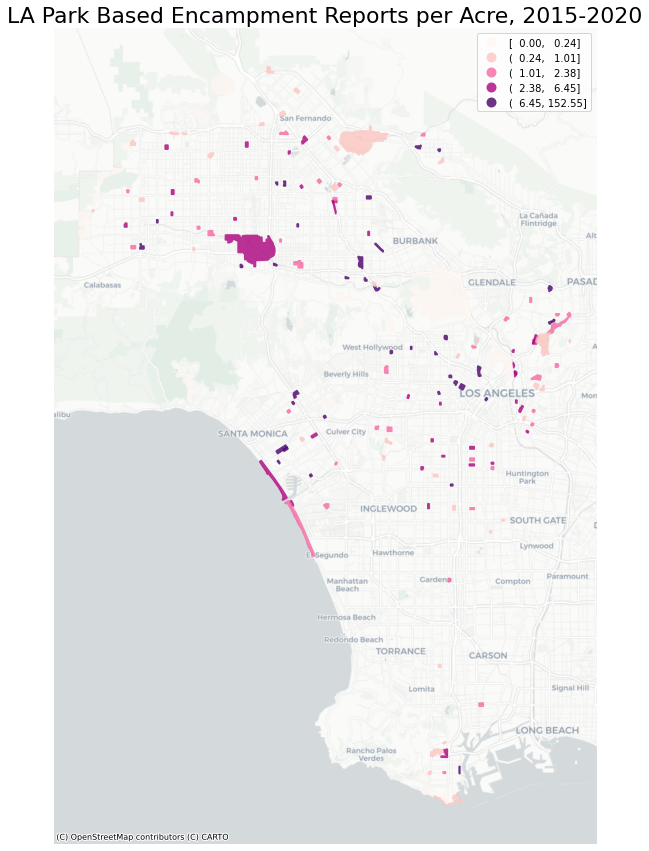

In [37]:
#map non-spatial lag column for comparison
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
park_encamp_large.plot(ax=ax,
         figsize=(15,15),
         column='encamp_per_acre',
         legend=True,
         alpha=0.8,
         cmap='RdPu',
         scheme='quantiles')

ax.axis('off')
ax.set_title('LA Park Based Encampment Reports per Acre, 2015-2020',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

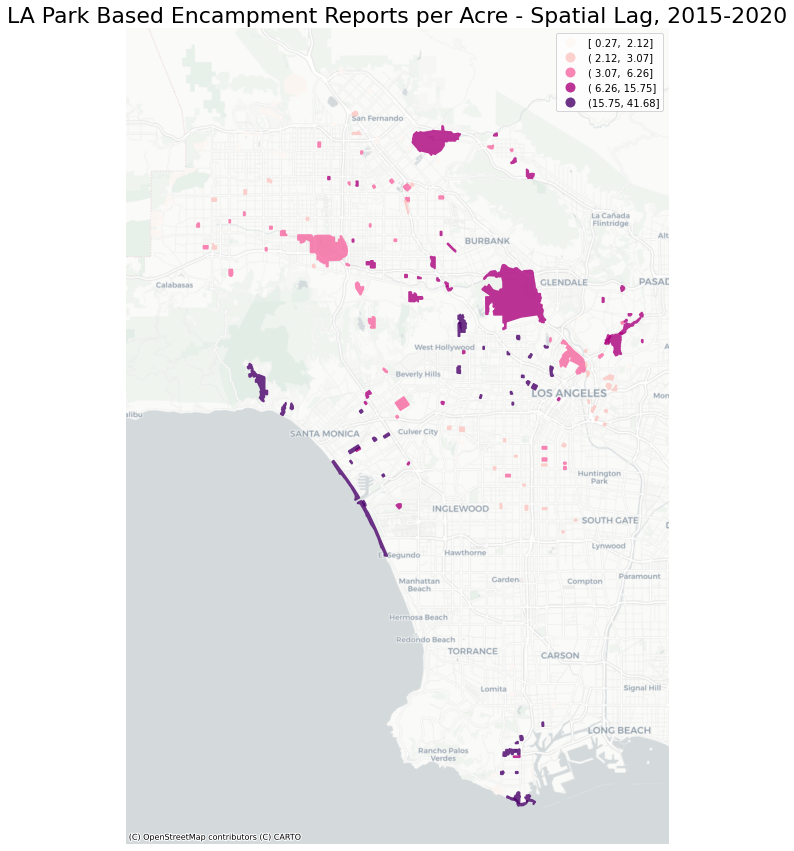

In [38]:
#map spatial lag column
#use subplots that make it easier to create multiple layered maps
fig, ax = plt.subplots(figsize=(15, 15))

# spatial lag choropleth
park_encamp_large.plot(ax=ax,
         figsize=(15,15),
         column='encamp_per_acre_lag',
         legend=True,
         alpha=0.8,
         cmap='RdPu',
         scheme='quantiles')

ax.axis('off')
ax.set_title('LA Park Based Encampment Reports per Acre - Spatial Lag, 2015-2020',fontsize=22)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [39]:
# interactive version 
#needs to be in WGS84
park_encamp_large_web = park_encamp_large.to_crs('EPSG:4326')

In [40]:
#find the centroid
minx, miny, maxx, maxy = park_encamp_large_web.geometry.total_bounds
center_lat_park_encamp_large_web = (maxy-miny)/2+miny
center_lon_park_encamp_large_web = (maxx-minx)/2+minx

In [41]:
#get stats to manually set scale values
park_encamp_large_web.encamp_per_acre_lag.describe()

count    182.000000
mean       8.538618
std        9.153734
min        0.268080
25%        2.379752
50%        4.112084
75%       12.143714
max       41.683511
Name: encamp_per_acre_lag, dtype: float64

In [42]:
# grab the median
median = park_encamp_large_web.encamp_per_acre_lag.median()

In [43]:
#insert mapbox token (this is Yoh's token, thanks Yoh)
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [44]:
#interactive spatial lag mapping
fig8 = px.choropleth_mapbox(park_encamp_large_web, 
                     geojson=park_encamp_large_web.geometry, 
                     locations=park_encamp_large_web.index, 
                     mapbox_style="carto-positron",
                     zoom=9, 
                     color='encamp_per_acre_lag',
                     color_continuous_scale='RdPu',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['park_name','type','total','encamp_per_acre','encamp_per_acre_lag'],
                     center = {"lat": center_lat_park_encamp_large_web, "lon": center_lon_park_encamp_large_web},
                     opacity=0.8,
                     width=1000,
                     height=800,
                     labels={
                             'encamp_per_acre_lag':'Encampment Reports per Acre (Spatial Lag)',
                             'encamp_per_acre':'Encampment Reports per Acre',
                             'index':'Park ID',
                             'park_name':'Park Name',
                             'type':'Park Type',
                             'total':'Encampment Reports'
                     })
fig8.update_traces(marker_line_width=0.1, marker_line_color='white')
fig8.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [45]:
#save it
fig8.write_html("Encampment Reports per Acre (Spatial Lag).html")

### Global Autocorrelation - Moran Plot & P Value

In [46]:
#starting gloabl autocorrelation with Moran's Plot
y = park_encamp_large.encamp_per_acre
moran = Moran(y, wq)
moran.I

0.10766929193938057

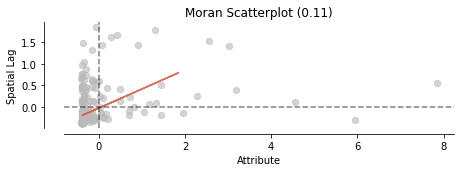

In [47]:
#which looks like this
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning:


The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.



(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fd3541f2ee0>)

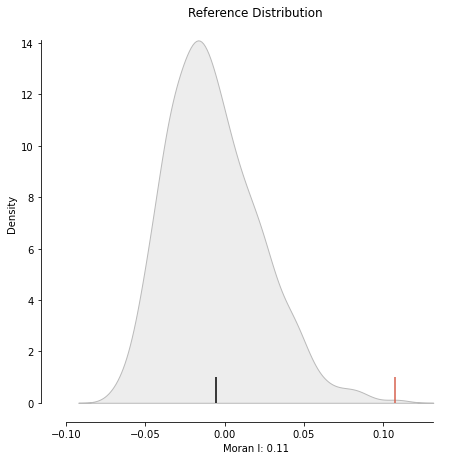

In [48]:
#What's the significance? Compare to 999 random permutations.
plot_moran_simulation(moran,aspect_equal=False)

In [49]:
#calculate P value
#this is a very low p value
moran.p_sim

0.003

In [50]:
#now we can do local spatial autocorrelation
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

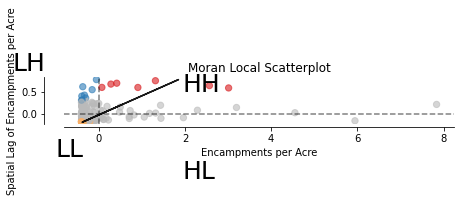

In [51]:
# Plot
#the colored dots represents the rows that have a P-value less that 0.05 
#these are the statisticaly significantly, spatially autocorrelated geographies

fig, ax = moran_scatterplot(lisa, p=0.05)
ax.set_xlabel("Encampments per Acre")
ax.set_ylabel('Spatial Lag of Encampments per Acre')
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1.5, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

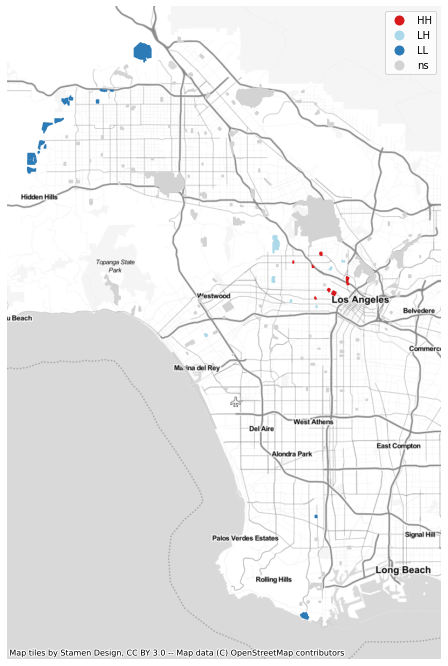

In [52]:
#let's see em on a map
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, park_encamp_large, p=0.05, ax=ax)
ctx.add_basemap(ax,source=ctx.providers.Stamen.TonerLite)
plt.show()

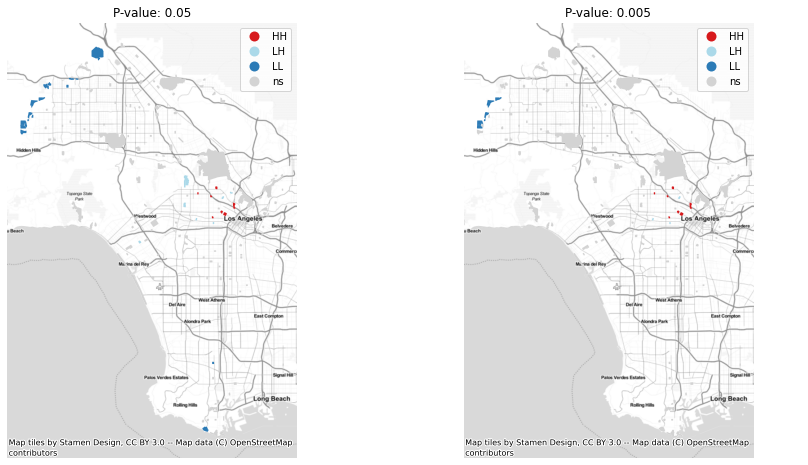

In [53]:
#fringes are low and Westlake is high - that makes sense
#we can test different P values too

# create the 1x2 subplots
fig, axs = plt.subplots(1, 2, figsize=(15, 8))

# name each subplot
ax1, ax2 = axs

#.05 P value on the left
lisa_cluster(lisa, park_encamp_large, p=0.05, ax=ax1)

ax1.axis("off")
ax1.set_title("P-value: 0.05")
ctx.add_basemap(ax1,source=ctx.providers.Stamen.TonerLite)

# previously calculated P value on right
lisa_cluster(lisa, park_encamp_large, p=0.01, ax=ax2)
ax2.axis("off")
ax2.set_title("P-value: 0.005")
ctx.add_basemap(ax2,source=ctx.providers.Stamen.TonerLite)

plt.show()

In [54]:
#Finally, let's get an interactive version of these significant parks
# original value list
lisa.y[:5]

array([152.55111426, 117.49048183,  91.70405077,  66.58616515,
        63.20920911])

In [55]:
# quadrant list
lisa.q[:5]

array([1, 4, 1, 1, 1])

In [56]:
# p sim list
lisa.p_sim[:5]

array([0.053, 0.122, 0.232, 0.131, 0.005])

In [57]:
# add quadrant numbers to the dataframe
park_encamp_large['q'] = lisa.q.tolist()

In [58]:
# add individual p-values to the dataframe
park_encamp_large['p_sim'] = lisa.p_sim.tolist()

In [59]:
park_encamp_large.head()

,park_name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,cd,cd_member,nc,nc_name,precint,total,encamp_per_acre,encamp_per_acre_lag,q,p_sim
276,Shatto Recreation Center,"POLYGON ((-13167986.847 4038096.905, -13167977...",237571.355728,5.453910,N,"3191 W 4th St, LA 90020",Shatto Rec. Center,Open Access,Neighborhood Park,13,Mitch O'Farrell,53,RAMPART VILLAGE NC,OLYMPIC,832,152.551114,17.577024,1,0.053
266,San Pedro Plaza Park,"POLYGON ((-13166974.258 3992825.568, -13166980...",152749.805211,3.506667,N,"700 S Beacon St, San Pedro 90731",San Pedro Plaza Park,Open Access,Pocket Park,15,Joe Buscaino,95,CENTRAL SAN PEDRO NC,HARBOR,412,117.490482,1.736738,4,0.122
231,Penmar Recreation Center,"POLYGON ((-13186748.007 4029310.478, -13186752...",522979.822165,12.006013,N,"1341 E Lake St, 90291",Penmar Rec. Center,Open Access,Community Park,11,Mike Bonin,68,VENICE NC,PACIFIC,1101,91.704051,9.541978,1,0.232
234,Poinsettia Recreation Center,"POLYGON ((-13174825.755 4040739.966, -13174825...",274104.492308,6.292598,N,"7341 W Willoughby Ave, 90046",Poinsettia Rec. Center,Open Access,Neighborhood Park,5,Paul Koretz,58,MID CITY WEST CC,WILSHIRE,419,66.586165,14.602102,1,0.131
130,Hollywood Recreation Center,"POLYGON ((-13172323.704 4041360.855, -13172312...",135760.05451,3.116634,N,"1122 N Cole Ave, LA 90038",Hollywood Rec. Center,Open Access,Pocket Park,13,Mitch O'Farrell,32,CENTRAL HOLLYWOOD NC,HOLLYWOOD,197,63.209209,33.571526,1,0.005


In [60]:
#with these numbers in place, we can make a hotspot map
# identify just the hotspot geographies
hot_spots = park_encamp_large[(park_encamp_large.p_sim < 0.05) & (park_encamp_large.q == 1)]

In [61]:
hot_spots.shape

(7, 19)

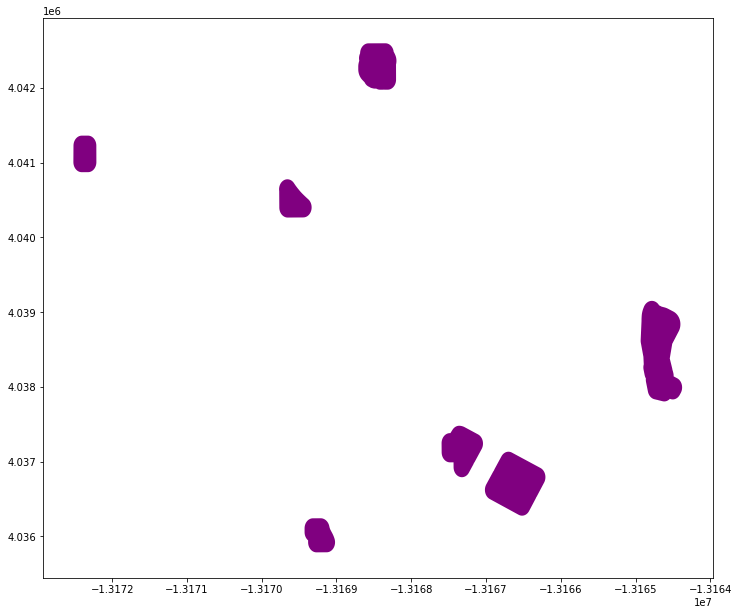

In [62]:
# quick plot - no more downtown parks! We have Westlake here
#and Hollywood? I forget what is directly north
hot_spots.plot(figsize=(12,12),color='purple',legend=True,categorical=True)

In [63]:
# interactive version needs to be in WGS84
hot_spots = hot_spots.to_crs('EPSG:4326')

In [64]:
# what's the centroid?
minx, miny, maxx, maxy = hot_spots.geometry.total_bounds
center_lat_hot_spots = (maxy-miny)/2+miny
center_lon_hot_spots = (maxx-minx)/2+minx

In [65]:
#interactive significance map
fig = px.choropleth_mapbox(hot_spots, 
                     geojson=hot_spots.geometry, 
                     locations=hot_spots.index, 
                     mapbox_style="carto-positron",
                     center = {"lat": center_lat_hot_spots, "lon": center_lon_hot_spots},
                     zoom=9, 
                     opacity=0.6,
                     color='encamp_per_acre_lag',
                     color_continuous_scale='RdPu',
                     color_continuous_midpoint =median,
                     range_color =(0,median*2),
                     hover_data=['park_name','total','encamp_per_acre','encamp_per_acre_lag'],
                     labels={
                           'encamp_per_acre_lag':'Encampment Reports per Acre (Spatial Lag)',
                             'encamp_per_acre':'Encampment Reports per Acre',
                             'index':'Park ID',
                             'park_name':'Park Name',
                             'type':'Park Type',
                             'total':'Encampment Reports'
                     })
fig.update_traces(marker_line_width=1, marker_line_color='white')
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

In [66]:
fig.write_html("Significant_only.html")